# 1. 实验前导

In [1]:
import torch
import torchvision
from torchvision import transforms, datasets
import torch.nn as nn
import torch.utils.data as tud
import matplotlib.pyplot as plt
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
torch.cuda.is_available() 

True

s

# 2. 准备数据

In [3]:
'''
mnist_data = datasets.MNIST("./mnist_data",train=True,download=True,
                                 transform = transforms.Compose([
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=(0.13066062,),std=(0.30810776,))
                                 ]))                             
batch_size = 32
dataloader = tud.DataLoader(mnist_data,batch_size = batch_size,shuffle=True)          # 将dataset转换为iterator
'''
mnist_data = datasets.MNIST("./mnist_data",train=True,download=True,
                                 transform = transforms.Compose([
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=(0.5,),std=(0.5,))
                                 ]))
batch_size = 32
dataloader = tud.DataLoader(mnist_data,batch_size = batch_size,shuffle=True)          # 将dataset转换为iterator

# 3. 配置网络

In [4]:
image_size = 28 * 28
hidden_size = 256
# 写出经典gan网络的判别器和生成器
# 判别器
# write your code here
D = nn.Sequential(
    nn.Linear(image_size,hidden_size),
    nn.LeakyReLU(0.2),
    nn.Linear(hidden_size,hidden_size),
    nn.LeakyReLU(0.2),
    nn.Linear(hidden_size,1),
    nn.Sigmoid()
)


latent_size = 64
# 生成器
# write your code here
G = nn.Sequential(
    nn.Linear(latent_size,hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,image_size),
    nn.Tanh()
)


D = D.to(device)
G = G.to(device)

# define your loss function
# write your code here
loss_fn = nn.BCELoss()
# define your optimizer
# write your code here(需要分别定义生成器和判别器的优化器)
d_optimizer = torch.optim.Adam(D.parameters(),lr=0.0003)
g_optimizer = torch.optim.Adam(G.parameters(),lr=0.0003)

# 4. 训练网络

In [5]:
total_steps = len(dataloader)
num_epochs = 30
for epoch in range(num_epochs):
    for i, (images, _) in enumerate(dataloader):
        batch_size = images.shape[0]
        images = images.reshape(batch_size,image_size).to(device)
        real_labels = torch.ones(batch_size,1).to(device) #生成全1的标签
        fake_labels = torch.zeros(batch_size,1).to(device)#生成全0的标签
        
        ### 判别器的训练过程
        # write your code here
        outputs = D(images)
        d_loss_real = loss_fn(outputs,real_labels)# 跟全1向量进行对比
        real_score = outputs
        
        z = torch.randn(batch_size,latent_size).to(device)
        fake_images = G(z) #生成虚假样本
        outputs = D(fake_images.detach())
        d_loss_fake = loss_fn(outputs,fake_labels)#跟全0向量进行对比
        fake_score = outputs
        
        d_loss = d_loss_real + d_loss_fake # 计算总的损失
        
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()
        
        
        ### 生成器的训练过程
        # write your code here
        
        outputs = D(fake_images)
        g_loss = loss_fn(outputs,real_labels)
        g_score = outputs
        d_optimizer.zero_grad()
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()
       

        ### 输出训练过程        
        if i % 200 == 0:
            print("Epoch [{}/{}], Step [{}/{}], d_loss:{:.4f}, g_loss:{:.4f}, D(x):{:.2f}, D(G(z)):{:.2f}, G(z):{:.2f}"
                 .format(epoch, num_epochs,i, total_steps, d_loss.item(), g_loss.item(), 
                         real_score.mean().item(), fake_score.mean().item(), g_score.mean().item()))
        

Epoch [0/30], Step [0/1875], d_loss:1.3565, g_loss:0.7035, D(x):0.51, D(G(z)):0.50, G(z):0.49
Epoch [0/30], Step [200/1875], d_loss:0.0290, g_loss:4.5231, D(x):1.00, D(G(z)):0.03, G(z):0.01
Epoch [0/30], Step [400/1875], d_loss:0.1080, g_loss:5.8564, D(x):0.96, D(G(z)):0.06, G(z):0.00
Epoch [0/30], Step [600/1875], d_loss:0.5235, g_loss:4.5318, D(x):0.78, D(G(z)):0.16, G(z):0.07
Epoch [0/30], Step [800/1875], d_loss:0.2063, g_loss:4.9523, D(x):0.92, D(G(z)):0.08, G(z):0.03
Epoch [0/30], Step [1000/1875], d_loss:0.1179, g_loss:4.1009, D(x):0.96, D(G(z)):0.06, G(z):0.03
Epoch [0/30], Step [1200/1875], d_loss:1.6445, g_loss:3.2695, D(x):0.45, D(G(z)):0.07, G(z):0.06
Epoch [0/30], Step [1400/1875], d_loss:0.1559, g_loss:3.8772, D(x):0.92, D(G(z)):0.04, G(z):0.03
Epoch [0/30], Step [1600/1875], d_loss:0.1801, g_loss:2.5556, D(x):0.95, D(G(z)):0.11, G(z):0.08
Epoch [0/30], Step [1800/1875], d_loss:0.4971, g_loss:2.0418, D(x):0.80, D(G(z)):0.20, G(z):0.15
Epoch [1/30], Step [0/1875], d_loss:0

# 5. 模型评估

0.47401127219200134
0.13791953027248383
0.5437867641448975
0.23158200085163116
0.33126506209373474
0.13331365585327148
0.03968026489019394
0.06429577618837357
0.23522327840328217
0.3389214277267456
0.3342437148094177
0.22012807428836823
0.011982136406004429
0.19465908408164978
0.37640801072120667
0.3649173676967621
0.13515527546405792
0.11964587867259979
0.5018325448036194
0.47225144505500793
0.18015114963054657
0.07786045223474503
0.2342531681060791
0.07845255732536316
0.022495513781905174
0.08064679056406021
0.3541984260082245
0.46074575185775757
0.6186602711677551
0.4183432161808014
0.06211813539266586
0.0709366574883461


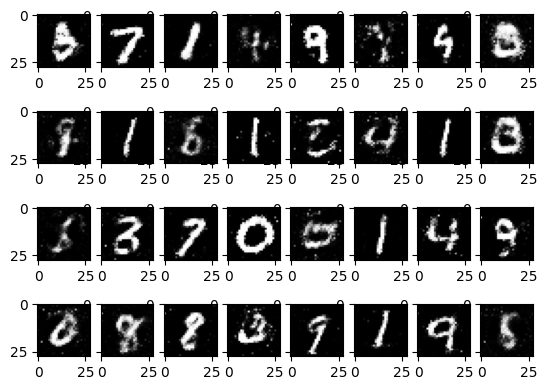

In [6]:
z = torch.randn(batch_size,latent_size).to(device)# 随机生成一个Batch的向量
fake_images = G(z) # 生成该Batch向量的图像
fake_images = fake_images.view(batch_size,28,28).data.cpu().numpy() # 将图像转化为二维，以便展示
# 查看生成图的判别结果
# 把numpy改tensor
fake_images_t = torch.from_numpy(fake_images)
fake_images_t = fake_images_t.to(device)
outputs = D(fake_images_t.reshape(batch_size,image_size))
outputs = outputs.reshape(-1)

# index = 5
# plt.imshow(fake_images[index],cmap=plt.cm.gray)
# print(outputs[index].item())

for i in range(32):
    print(outputs[i].item())
    # 利用plt一次输出十个图
    plt.subplot(4,8,i+1) # 4行8列 i+1:第几个图
    plt.imshow(fake_images[i],cmap=plt.cm.gray) # 挑选Batch的第一个图像，进行展示


# 6. 模型存储

In [7]:
torch.save(G.state_dict(),"mnist_generator.pth")
torch.save(D.state_dict(),"mnist_discriminator.pth")

### Load模型评估

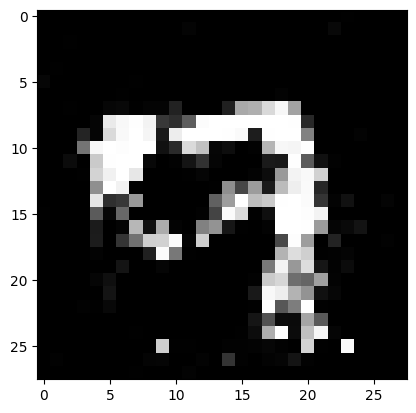

In [8]:
image_size = 28 * 28
hidden_size = 256
latent_size = 64
batch_size = 32
G = nn.Sequential(
    nn.Linear(latent_size, hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,image_size),
    nn.Tanh()    
)
G = G.to(device)
G.load_state_dict(torch.load("mnist_generator.pth"))
z = torch.randn(batch_size,latent_size).to(device)
fake_images = G(z)
fake_images = fake_images.view(batch_size,28,28).data.cpu().numpy()
plt.imshow(fake_images[0],cmap=plt.cm.gray)

# 老师代码

In [9]:
image_size = 28 * 28
hidden_size = 256
# 写出经典gan网络的判别器和生成器
# 判别器
D = nn.Sequential(
    nn.Linear(image_size,hidden_size),
    nn.LeakyReLU(0.2),
    nn.Linear(hidden_size,hidden_size),
    nn.LeakyReLU(0.2),
    nn.Linear(hidden_size,1),
    nn.Sigmoid()
)
latent_size = 64
# 生成器
G = nn.Sequential(
    nn.Linear(latent_size,hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size,image_size),
    nn.Tanh()
)
D = D.to(device)
G = G.to(device)

# define your loss function
loss_fn = nn.BCELoss()
# define your optimizer
# 需要分别定义生成器和判别器的优化器
d_optimizer = torch.optim.Adam(D.parameters(),lr=0.0003)
g_optimizer = torch.optim.Adam(G.parameters(),lr=0.0003)

## 拓展代码

我们上课学习到了GAN网络的应用，本次GAN网络扩展作业主要有以下内容
 - 1. 实现GAN网络的风格迁移代码


风格迁移主要是通过将内容图像和风格图像分别输入到VGG网络中，提取出内容特征和风格特征，然后通过最小化内容特征和风格特征的差异，来实现风格迁移。

E:\Anaconda\envs\deepl\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Anaconda\envs\deepl\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


[epoch:   0/5000] content loss: 0.000000 style loss: 0.085014 total loss: 8.501369
[epoch:   1/5000] content loss: 0.133469 style loss: 0.077188 total loss: 7.852272
[epoch:   2/5000] content loss: 0.159113 style loss: 0.071642 total loss: 7.323331
[epoch:   3/5000] content loss: 0.177955 style loss: 0.066822 total loss: 6.860128
[epoch:   4/5000] content loss: 0.195147 style loss: 0.062495 total loss: 6.444603
[epoch:   5/5000] content loss: 0.211131 style loss: 0.058581 total loss: 6.069233
[epoch:   6/5000] content loss: 0.225065 style loss: 0.055025 total loss: 5.727552
[epoch:   7/5000] content loss: 0.237883 style loss: 0.051780 total loss: 5.415916
[epoch:   8/5000] content loss: 0.249581 style loss: 0.048809 total loss: 5.130530
[epoch:   9/5000] content loss: 0.260507 style loss: 0.046091 total loss: 4.869630
[epoch:  10/5000] content loss: 0.270710 style loss: 0.043607 total loss: 4.631436
[epoch:  11/5000] content loss: 0.280012 style loss: 0.041343 total loss: 4.414349
[epo

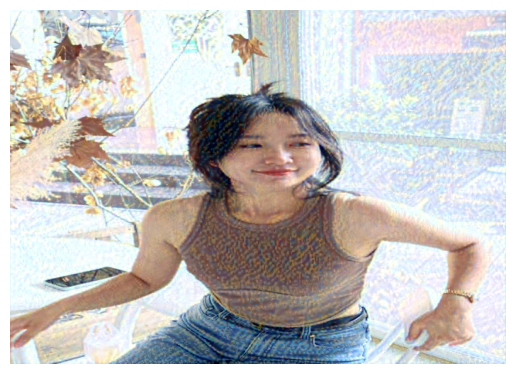

[epoch: 101/5000] content loss: 0.179096 style loss: 0.013240 total loss: 1.503047
[epoch: 102/5000] content loss: 0.178477 style loss: 0.013170 total loss: 1.495521
[epoch: 103/5000] content loss: 0.177875 style loss: 0.013102 total loss: 1.488070
[epoch: 104/5000] content loss: 0.177290 style loss: 0.013034 total loss: 1.480695
[epoch: 105/5000] content loss: 0.176687 style loss: 0.012967 total loss: 1.473392
[epoch: 106/5000] content loss: 0.176113 style loss: 0.012900 total loss: 1.466154
[epoch: 107/5000] content loss: 0.175555 style loss: 0.012834 total loss: 1.458985
[epoch: 108/5000] content loss: 0.174981 style loss: 0.012769 total loss: 1.451884
[epoch: 109/5000] content loss: 0.174434 style loss: 0.012704 total loss: 1.444848
[epoch: 110/5000] content loss: 0.173876 style loss: 0.012640 total loss: 1.437880
[epoch: 111/5000] content loss: 0.173306 style loss: 0.012577 total loss: 1.430979
[epoch: 112/5000] content loss: 0.172770 style loss: 0.012514 total loss: 1.424140
[epo

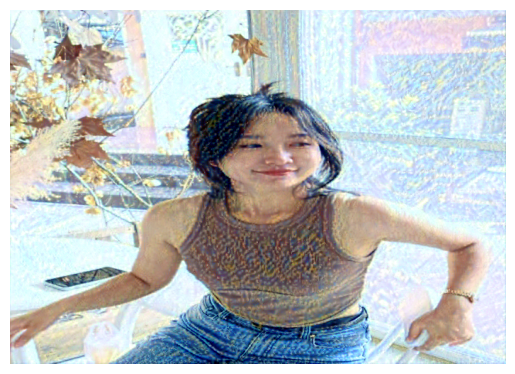

[epoch: 201/5000] content loss: 0.142489 style loss: 0.008259 total loss: 0.968384
[epoch: 202/5000] content loss: 0.142143 style loss: 0.008222 total loss: 0.964381
[epoch: 203/5000] content loss: 0.141936 style loss: 0.008185 total loss: 0.960407
[epoch: 204/5000] content loss: 0.141764 style loss: 0.008147 total loss: 0.956455
[epoch: 205/5000] content loss: 0.141470 style loss: 0.008110 total loss: 0.952515
[epoch: 206/5000] content loss: 0.141341 style loss: 0.008072 total loss: 0.948590
[epoch: 207/5000] content loss: 0.141072 style loss: 0.008036 total loss: 0.944685
[epoch: 208/5000] content loss: 0.140850 style loss: 0.008000 total loss: 0.940805
[epoch: 209/5000] content loss: 0.140682 style loss: 0.007963 total loss: 0.936946
[epoch: 210/5000] content loss: 0.140420 style loss: 0.007927 total loss: 0.933099
[epoch: 211/5000] content loss: 0.140234 style loss: 0.007890 total loss: 0.929266
[epoch: 212/5000] content loss: 0.139972 style loss: 0.007855 total loss: 0.925446
[epo

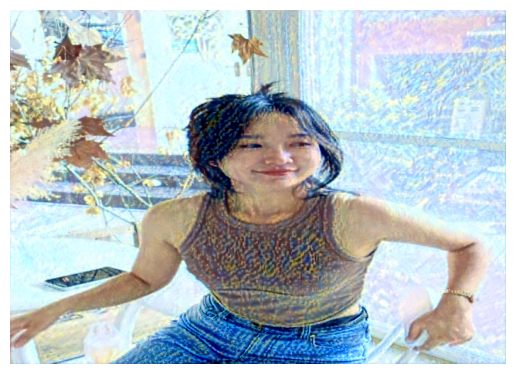

[epoch: 301/5000] content loss: 0.124564 style loss: 0.005295 total loss: 0.654030
[epoch: 302/5000] content loss: 0.124515 style loss: 0.005272 total loss: 0.651737
[epoch: 303/5000] content loss: 0.124296 style loss: 0.005252 total loss: 0.649464
[epoch: 304/5000] content loss: 0.124217 style loss: 0.005230 total loss: 0.647201
[epoch: 305/5000] content loss: 0.124034 style loss: 0.005209 total loss: 0.644955
[epoch: 306/5000] content loss: 0.123994 style loss: 0.005187 total loss: 0.642722
[epoch: 307/5000] content loss: 0.123717 style loss: 0.005168 total loss: 0.640508
[epoch: 308/5000] content loss: 0.123758 style loss: 0.005146 total loss: 0.638312
[epoch: 309/5000] content loss: 0.123473 style loss: 0.005127 total loss: 0.636127
[epoch: 310/5000] content loss: 0.123505 style loss: 0.005105 total loss: 0.633958
[epoch: 311/5000] content loss: 0.123226 style loss: 0.005086 total loss: 0.631805
[epoch: 312/5000] content loss: 0.123204 style loss: 0.005065 total loss: 0.629670
[epo

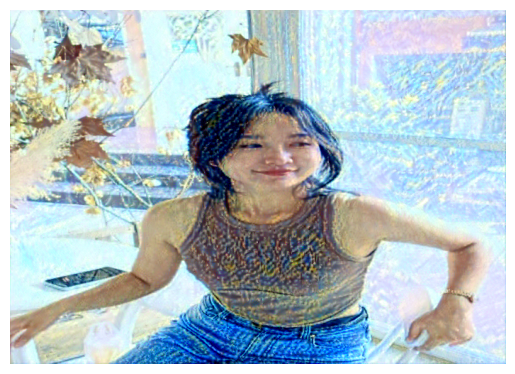

[epoch: 401/5000] content loss: 0.113295 style loss: 0.003790 total loss: 0.492338
[epoch: 402/5000] content loss: 0.113061 style loss: 0.003782 total loss: 0.491279
[epoch: 403/5000] content loss: 0.113157 style loss: 0.003771 total loss: 0.490233
[epoch: 404/5000] content loss: 0.112859 style loss: 0.003763 total loss: 0.489177
[epoch: 405/5000] content loss: 0.112970 style loss: 0.003751 total loss: 0.488109
[epoch: 406/5000] content loss: 0.112761 style loss: 0.003743 total loss: 0.487071
[epoch: 407/5000] content loss: 0.112652 style loss: 0.003734 total loss: 0.486046
[epoch: 408/5000] content loss: 0.112695 style loss: 0.003723 total loss: 0.485042
[epoch: 409/5000] content loss: 0.112480 style loss: 0.003716 total loss: 0.484033
[epoch: 410/5000] content loss: 0.112471 style loss: 0.003705 total loss: 0.483020
[epoch: 411/5000] content loss: 0.112325 style loss: 0.003697 total loss: 0.482003
[epoch: 412/5000] content loss: 0.112241 style loss: 0.003687 total loss: 0.480990
[epo

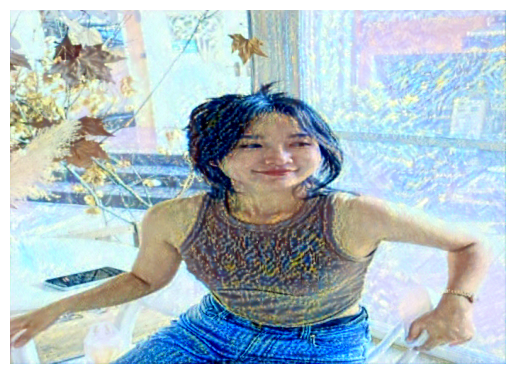

[epoch: 501/5000] content loss: 0.105546 style loss: 0.003076 total loss: 0.413096
[epoch: 502/5000] content loss: 0.105434 style loss: 0.003071 total loss: 0.412494
[epoch: 503/5000] content loss: 0.105384 style loss: 0.003065 total loss: 0.411885
[epoch: 504/5000] content loss: 0.105288 style loss: 0.003060 total loss: 0.411292
[epoch: 505/5000] content loss: 0.105267 style loss: 0.003054 total loss: 0.410713
[epoch: 506/5000] content loss: 0.105201 style loss: 0.003049 total loss: 0.410138
[epoch: 507/5000] content loss: 0.105122 style loss: 0.003044 total loss: 0.409567
[epoch: 508/5000] content loss: 0.105086 style loss: 0.003039 total loss: 0.409017
[epoch: 509/5000] content loss: 0.105017 style loss: 0.003034 total loss: 0.408436
[epoch: 510/5000] content loss: 0.104943 style loss: 0.003029 total loss: 0.407843
[epoch: 511/5000] content loss: 0.104915 style loss: 0.003024 total loss: 0.407277
[epoch: 512/5000] content loss: 0.104800 style loss: 0.003019 total loss: 0.406747
[epo

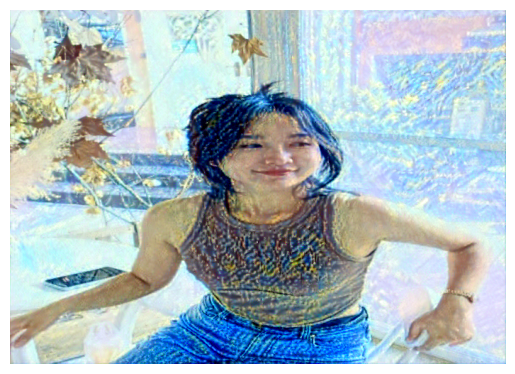

[epoch: 601/5000] content loss: 0.099913 style loss: 0.002646 total loss: 0.364516
[epoch: 602/5000] content loss: 0.099982 style loss: 0.002642 total loss: 0.364135
[epoch: 603/5000] content loss: 0.099791 style loss: 0.002639 total loss: 0.363710
[epoch: 604/5000] content loss: 0.099950 style loss: 0.002634 total loss: 0.363307
[epoch: 605/5000] content loss: 0.099624 style loss: 0.002633 total loss: 0.362931
[epoch: 606/5000] content loss: 0.099854 style loss: 0.002627 total loss: 0.362544
[epoch: 607/5000] content loss: 0.099553 style loss: 0.002626 total loss: 0.362150
[epoch: 608/5000] content loss: 0.099706 style loss: 0.002620 total loss: 0.361728
[epoch: 609/5000] content loss: 0.099536 style loss: 0.002618 total loss: 0.361341
[epoch: 610/5000] content loss: 0.099558 style loss: 0.002614 total loss: 0.360964
[epoch: 611/5000] content loss: 0.099451 style loss: 0.002611 total loss: 0.360566
[epoch: 612/5000] content loss: 0.099483 style loss: 0.002607 total loss: 0.360169
[epo

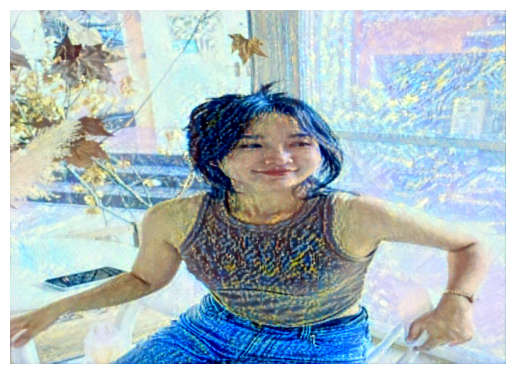

[epoch: 701/5000] content loss: 0.095431 style loss: 0.002345 total loss: 0.329963
[epoch: 702/5000] content loss: 0.095420 style loss: 0.002342 total loss: 0.329663
[epoch: 703/5000] content loss: 0.095307 style loss: 0.002341 total loss: 0.329374
[epoch: 704/5000] content loss: 0.095433 style loss: 0.002336 total loss: 0.329080
[epoch: 705/5000] content loss: 0.095106 style loss: 0.002337 total loss: 0.328770
[epoch: 706/5000] content loss: 0.095432 style loss: 0.002331 total loss: 0.328492
[epoch: 707/5000] content loss: 0.095021 style loss: 0.002332 total loss: 0.328228
[epoch: 708/5000] content loss: 0.095341 style loss: 0.002326 total loss: 0.327939
[epoch: 709/5000] content loss: 0.095071 style loss: 0.002326 total loss: 0.327680
[epoch: 710/5000] content loss: 0.095152 style loss: 0.002322 total loss: 0.327362
[epoch: 711/5000] content loss: 0.095058 style loss: 0.002320 total loss: 0.327039
[epoch: 712/5000] content loss: 0.094924 style loss: 0.002318 total loss: 0.326745
[epo

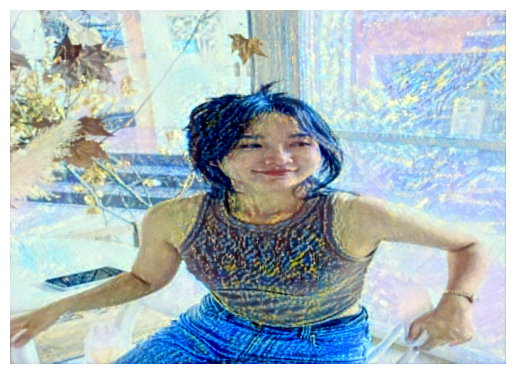

[epoch: 801/5000] content loss: 0.091899 style loss: 0.002122 total loss: 0.304051
[epoch: 802/5000] content loss: 0.091760 style loss: 0.002121 total loss: 0.303832
[epoch: 803/5000] content loss: 0.091887 style loss: 0.002117 total loss: 0.303595
[epoch: 804/5000] content loss: 0.091575 style loss: 0.002118 total loss: 0.303385
[epoch: 805/5000] content loss: 0.091816 style loss: 0.002113 total loss: 0.303152
[epoch: 806/5000] content loss: 0.091606 style loss: 0.002113 total loss: 0.302910
[epoch: 807/5000] content loss: 0.091623 style loss: 0.002111 total loss: 0.302698
[epoch: 808/5000] content loss: 0.091712 style loss: 0.002108 total loss: 0.302485
[epoch: 809/5000] content loss: 0.091446 style loss: 0.002108 total loss: 0.302240
[epoch: 810/5000] content loss: 0.091605 style loss: 0.002104 total loss: 0.301988
[epoch: 811/5000] content loss: 0.091360 style loss: 0.002104 total loss: 0.301778
[epoch: 812/5000] content loss: 0.091598 style loss: 0.002100 total loss: 0.301582
[epo

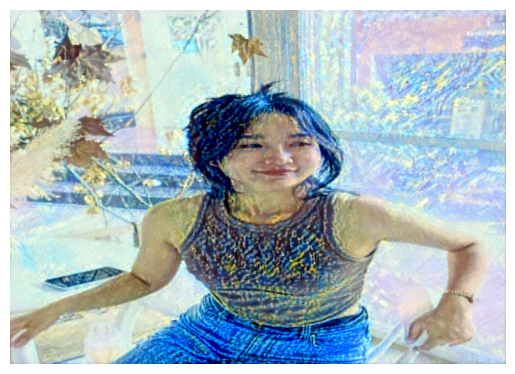

[epoch: 901/5000] content loss: 0.088854 style loss: 0.001948 total loss: 0.283692
[epoch: 902/5000] content loss: 0.088881 style loss: 0.001946 total loss: 0.283520
[epoch: 903/5000] content loss: 0.088732 style loss: 0.001946 total loss: 0.283351
[epoch: 904/5000] content loss: 0.088836 style loss: 0.001943 total loss: 0.283160
[epoch: 905/5000] content loss: 0.088704 style loss: 0.001943 total loss: 0.282978
[epoch: 906/5000] content loss: 0.088767 style loss: 0.001940 total loss: 0.282806
[epoch: 907/5000] content loss: 0.088633 style loss: 0.001940 total loss: 0.282648
[epoch: 908/5000] content loss: 0.088746 style loss: 0.001937 total loss: 0.282452
[epoch: 909/5000] content loss: 0.088547 style loss: 0.001937 total loss: 0.282245
[epoch: 910/5000] content loss: 0.088670 style loss: 0.001934 total loss: 0.282067
[epoch: 911/5000] content loss: 0.088469 style loss: 0.001934 total loss: 0.281896
[epoch: 912/5000] content loss: 0.088686 style loss: 0.001930 total loss: 0.281699
[epo

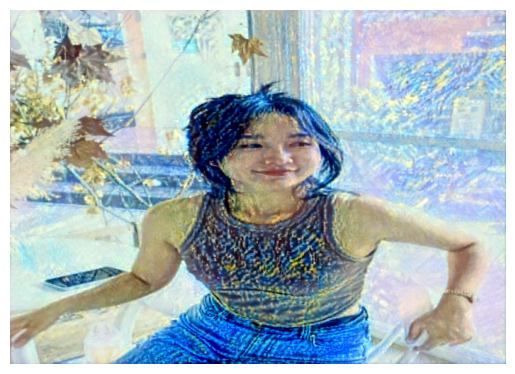

[epoch: 1001/5000] content loss: 0.086480 style loss: 0.001808 total loss: 0.267249
[epoch: 1002/5000] content loss: 0.086295 style loss: 0.001808 total loss: 0.267077
[epoch: 1003/5000] content loss: 0.086404 style loss: 0.001805 total loss: 0.266916
[epoch: 1004/5000] content loss: 0.086288 style loss: 0.001805 total loss: 0.266796
[epoch: 1005/5000] content loss: 0.086370 style loss: 0.001803 total loss: 0.266641
[epoch: 1006/5000] content loss: 0.086148 style loss: 0.001803 total loss: 0.266472
[epoch: 1007/5000] content loss: 0.086411 style loss: 0.001799 total loss: 0.266340
[epoch: 1008/5000] content loss: 0.086050 style loss: 0.001802 total loss: 0.266249
[epoch: 1009/5000] content loss: 0.086456 style loss: 0.001796 total loss: 0.266037
[epoch: 1010/5000] content loss: 0.085971 style loss: 0.001799 total loss: 0.265895
[epoch: 1011/5000] content loss: 0.086336 style loss: 0.001794 total loss: 0.265745
[epoch: 1012/5000] content loss: 0.086072 style loss: 0.001795 total loss: 0

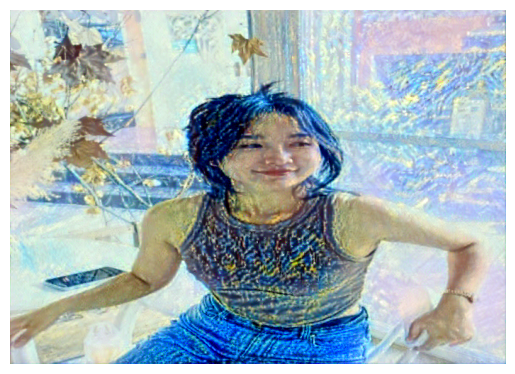

[epoch: 1101/5000] content loss: 0.084226 style loss: 0.001692 total loss: 0.253440
[epoch: 1102/5000] content loss: 0.084353 style loss: 0.001689 total loss: 0.253287
[epoch: 1103/5000] content loss: 0.084096 style loss: 0.001691 total loss: 0.253173
[epoch: 1104/5000] content loss: 0.084350 style loss: 0.001687 total loss: 0.253063
[epoch: 1105/5000] content loss: 0.084121 style loss: 0.001688 total loss: 0.252940
[epoch: 1106/5000] content loss: 0.084233 style loss: 0.001686 total loss: 0.252798
[epoch: 1107/5000] content loss: 0.084081 style loss: 0.001686 total loss: 0.252645
[epoch: 1108/5000] content loss: 0.084144 style loss: 0.001684 total loss: 0.252544


KeyboardInterrupt: 

In [1]:
import torch
import numpy as np
from PIL import Image
from torchvision.models import vgg19
from torchvision.transforms import transforms
import torch.nn as nn
import matplotlib.pyplot as plt
from torch.nn.functional import mse_loss
from torch.autograd import Variable

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 预处理：大小裁剪、转为张量、归一化
def preprocess(img_shape):
    transform = transforms.Compose([
        transforms.Resize(img_shape),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
    ])
    return transform

class VGGNet19(nn.Module):
    def __init__(self):
        super(VGGNet19, self).__init__()
        self.vggnet19 = vgg19(pretrained=False)
        self.vggnet19.load_state_dict(torch.load('./vgg19-dcbb9e9d.pth'))
        self.content_layers = [25]
        self.style_layers = [0, 5, 10, 19, 28]

    def forward(self, x):
        content_features = []
        style_features = []
        for name, module in self.vggnet19.features._modules.items():
            x = module(x)
            if int(name) in self.content_layers:
                content_features.append(x)
            if int(name) in self.style_layers:
                style_features.append(x)
        return content_features, style_features

class GenerateImage(nn.Module):
    def __init__(self, img_shape):
        super(GenerateImage, self).__init__()
        self.weight = torch.nn.Parameter(torch.rand(*img_shape))

    def forward(self):
        return self.weight

# 初始化生成图像为内容图像
def generate_inits(content, device, lr):
    g_img = GenerateImage(content.shape).to(device)
    g_img.weight.data = content.data
    optimizer = torch.optim.Adam(g_img.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-08, weight_decay=0)
    return g_img(), optimizer

# 计算格拉姆矩阵
def gramMatrix(x):
    _, c, h, w = x.shape
    x = x.view(c, h*w)
    return torch.matmul(x, x.t()) / (c*h*w)

# 计算总损失：内容损失+样式损失
def compute_loss(content_g, content_y, style_g, style_y, content_weight, style_weight, gamma):
    contentlosses = [mse_loss(g, y)*content_weight for g, y in zip(content_g, content_y)]
    stylelosses = [mse_loss(gramMatrix(g), gramMatrix(y))*style_weight for g, y in zip(style_g, style_y)]
    total_loss = sum(contentlosses) + gamma * sum(stylelosses)
    return contentlosses, stylelosses, total_loss

# 用于可视化的后处理
def postprocess(img_tensor):
    rgb_mean = np.array([0.485, 0.456, 0.406])
    rgb_std = np.array([0.229, 0.224, 0.225])
    inv_normalize = transforms.Normalize(
        mean=-rgb_mean/rgb_std,
        std=1/rgb_std)
    to_PIL_image = transforms.ToPILImage()
    return to_PIL_image(inv_normalize(img_tensor[0].detach().cpu()).clamp(0, 1))

def train(lr, epoch_num, c_path, s_path, img_shape):
    ipt = Image.open(c_path)
    syl = Image.open(s_path)
    transform = preprocess(img_shape)
    content, style = transform(ipt).unsqueeze(0), transform(syl).unsqueeze(0)
    net = VGGNet19()
    net.to(device).eval()

    content = content.type(torch.FloatTensor)
    style = style.type(torch.FloatTensor)
    if torch.cuda.is_available():
        content, style = Variable(content.cuda(), requires_grad=False), Variable(style.cuda(), requires_grad=False)
    else:
        content, style = Variable(content, requires_grad=False), Variable(style, requires_grad=False)

    icontent, istyle = net(content)
    scontent, sstyle = net(style)

    input, optimizer = generate_inits(content, device, lr)

    for epoch in range(epoch_num+1):
        gcontent, gstyle = net(input)
        contentlosses, stylelosses, total_loss = compute_loss(gcontent, icontent, gstyle, sstyle, 1, 1e3, 1e2)
        optimizer.zero_grad()
        total_loss.backward(retain_graph=True)
        optimizer.step()
        print("[epoch: %3d/%3d] content loss: %3f style loss: %3f total loss: %3f" % (epoch, epoch_num, sum(contentlosses).item(), sum(stylelosses).item(), total_loss))
        if epoch % 100 == 0 and epoch != 0:
            plt.imshow(postprocess(input))
            plt.axis('off')
            plt.show()
            #torch.save(net.state_dict(), "itr_%d_total_loss_%3f.pth" % (epoch, total_loss))
    #展示迁移后的图
    plt.imshow(postprocess(input))
    #保存
    plt.savefig('style_fg_yuhan.jpg')
    torch.save(net.state_dict(), "itr_%d_total_loss_%3f.pth" % (epoch, total_loss))
if __name__ == "__main__":
    train(0.01, 5000, './yuyan.jpg', './style_fg.jpg', (500, 700))

在人像的风格迁移中，我发现收敛效果很慢，出成效有点慢。再加上电脑训练很慢，显卡配置不高，所以展示了过程截图。并没有完整运行完该代码至结果输出

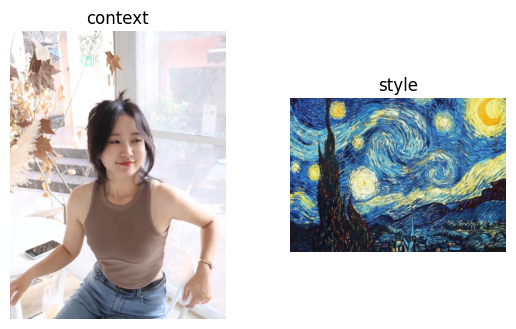

In [5]:
#展示原图和风格图
from PIL import Image
import matplotlib.pyplot as plt

# 读取三个图片
image1 = Image.open('yuyan.jpg')
image2 = Image.open('style_fg.jpg')

# 创建一个带有三个子图的画布
fig, axes = plt.subplots(1, 2)

# 在每个子图上显示图片和标题
axes[0].imshow(image1)
axes[0].set_title('context')

axes[1].imshow(image2)
axes[1].set_title('style')

# 隐藏坐标轴
for ax in axes:
    ax.axis('off')

# 调整子图之间的间距
plt.subplots_adjust(wspace=0.3)

# 展示图片
plt.show()


任务二、对风景照片进行梵高风格的图像风格迁移


[epoch:   0/500] content loss: 0.000000 style loss: 0.056463 total loss: 5.646282
[epoch:   1/500] content loss: 0.080810 style loss: 0.050272 total loss: 5.108044
[epoch:   2/500] content loss: 0.102863 style loss: 0.045826 total loss: 4.685506
[epoch:   3/500] content loss: 0.115484 style loss: 0.042076 total loss: 4.323063
[epoch:   4/500] content loss: 0.127395 style loss: 0.038804 total loss: 4.007783
[epoch:   5/500] content loss: 0.138516 style loss: 0.035942 total loss: 3.732682
[epoch:   6/500] content loss: 0.148791 style loss: 0.033464 total loss: 3.495239
[epoch:   7/500] content loss: 0.157659 style loss: 0.031358 total loss: 3.293461
[epoch:   8/500] content loss: 0.164467 style loss: 0.029599 total loss: 3.124375
[epoch:   9/500] content loss: 0.168896 style loss: 0.028148 total loss: 2.983652
[epoch:  10/500] content loss: 0.171338 style loss: 0.026951 total loss: 2.866398
[epoch:  11/500] content loss: 0.172207 style loss: 0.025953 total loss: 2.767521
[epoch:  12/500]

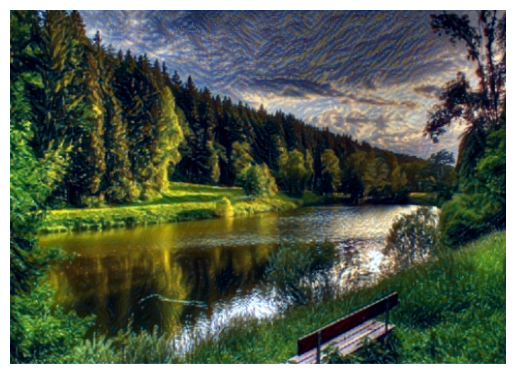

[epoch: 101/500] content loss: 0.081785 style loss: 0.009014 total loss: 0.983144
[epoch: 102/500] content loss: 0.081523 style loss: 0.008944 total loss: 0.975952
[epoch: 103/500] content loss: 0.081276 style loss: 0.008875 total loss: 0.968813
[epoch: 104/500] content loss: 0.081027 style loss: 0.008807 total loss: 0.961722
[epoch: 105/500] content loss: 0.080766 style loss: 0.008739 total loss: 0.954677
[epoch: 106/500] content loss: 0.080513 style loss: 0.008672 total loss: 0.947677
[epoch: 107/500] content loss: 0.080259 style loss: 0.008605 total loss: 0.940722
[epoch: 108/500] content loss: 0.080000 style loss: 0.008538 total loss: 0.933812
[epoch: 109/500] content loss: 0.079770 style loss: 0.008472 total loss: 0.926944
[epoch: 110/500] content loss: 0.079540 style loss: 0.008406 total loss: 0.920117
[epoch: 111/500] content loss: 0.079308 style loss: 0.008340 total loss: 0.913329
[epoch: 112/500] content loss: 0.079074 style loss: 0.008275 total loss: 0.906581
[epoch: 113/500]

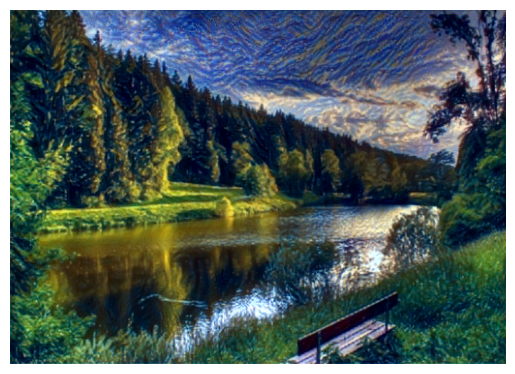

[epoch: 201/500] content loss: 0.065702 style loss: 0.003624 total loss: 0.428116
[epoch: 202/500] content loss: 0.065592 style loss: 0.003587 total loss: 0.424287
[epoch: 203/500] content loss: 0.065510 style loss: 0.003550 total loss: 0.420500
[epoch: 204/500] content loss: 0.065402 style loss: 0.003514 total loss: 0.416760
[epoch: 205/500] content loss: 0.065298 style loss: 0.003478 total loss: 0.413066
[epoch: 206/500] content loss: 0.065218 style loss: 0.003442 total loss: 0.409414
[epoch: 207/500] content loss: 0.065112 style loss: 0.003407 total loss: 0.405804
[epoch: 208/500] content loss: 0.065040 style loss: 0.003372 total loss: 0.402234
[epoch: 209/500] content loss: 0.064928 style loss: 0.003338 total loss: 0.398697
[epoch: 210/500] content loss: 0.064831 style loss: 0.003304 total loss: 0.395201
[epoch: 211/500] content loss: 0.064745 style loss: 0.003270 total loss: 0.391759
[epoch: 212/500] content loss: 0.064641 style loss: 0.003237 total loss: 0.388362
[epoch: 213/500]

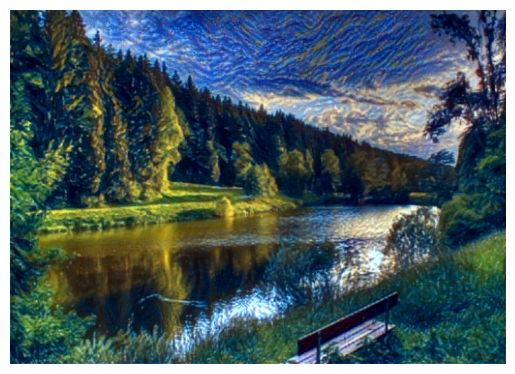

[epoch: 301/500] content loss: 0.057793 style loss: 0.001657 total loss: 0.223505
[epoch: 302/500] content loss: 0.057692 style loss: 0.001650 total loss: 0.222697
[epoch: 303/500] content loss: 0.057642 style loss: 0.001643 total loss: 0.221902
[epoch: 304/500] content loss: 0.057609 style loss: 0.001635 total loss: 0.221121
[epoch: 305/500] content loss: 0.057508 style loss: 0.001629 total loss: 0.220358
[epoch: 306/500] content loss: 0.057489 style loss: 0.001621 total loss: 0.219595
[epoch: 307/500] content loss: 0.057410 style loss: 0.001614 total loss: 0.218850
[epoch: 308/500] content loss: 0.057346 style loss: 0.001608 total loss: 0.218120
[epoch: 309/500] content loss: 0.057308 style loss: 0.001601 total loss: 0.217400
[epoch: 310/500] content loss: 0.057225 style loss: 0.001595 total loss: 0.216679
[epoch: 311/500] content loss: 0.057161 style loss: 0.001588 total loss: 0.215973
[epoch: 312/500] content loss: 0.057124 style loss: 0.001581 total loss: 0.215274
[epoch: 313/500]

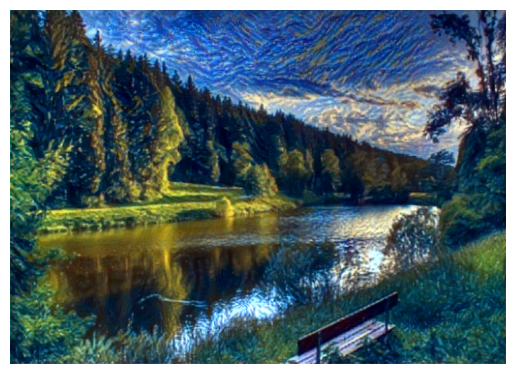

[epoch: 401/500] content loss: 0.052681 style loss: 0.001237 total loss: 0.176383
[epoch: 402/500] content loss: 0.052682 style loss: 0.001234 total loss: 0.176097
[epoch: 403/500] content loss: 0.052624 style loss: 0.001232 total loss: 0.175806
[epoch: 404/500] content loss: 0.052580 style loss: 0.001229 total loss: 0.175517
[epoch: 405/500] content loss: 0.052548 style loss: 0.001227 total loss: 0.175229
[epoch: 406/500] content loss: 0.052516 style loss: 0.001224 total loss: 0.174942
[epoch: 407/500] content loss: 0.052438 style loss: 0.001222 total loss: 0.174667
[epoch: 408/500] content loss: 0.052474 style loss: 0.001219 total loss: 0.174379
[epoch: 409/500] content loss: 0.052341 style loss: 0.001218 total loss: 0.174093
[epoch: 410/500] content loss: 0.052374 style loss: 0.001214 total loss: 0.173805
[epoch: 411/500] content loss: 0.052278 style loss: 0.001213 total loss: 0.173529
[epoch: 412/500] content loss: 0.052317 style loss: 0.001209 total loss: 0.173254
[epoch: 413/500]

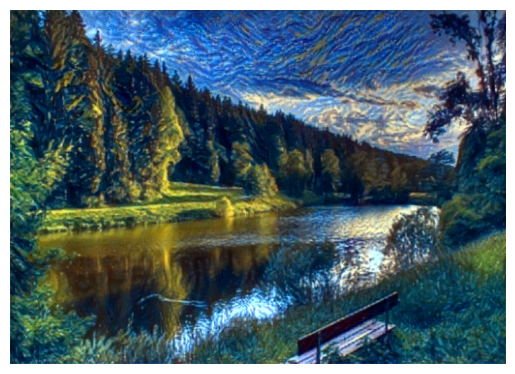

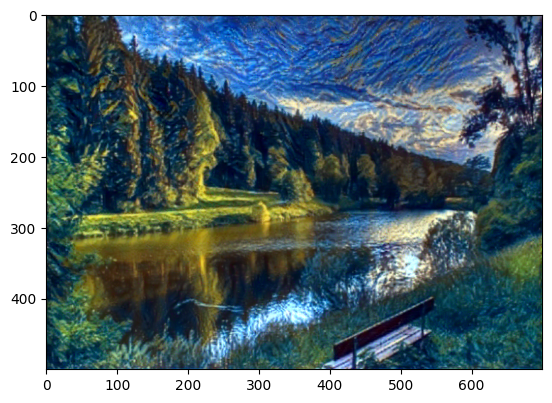

In [3]:
if __name__ == "__main__":
    train(0.01, 500, './context.jpg', './style_fg.jpg', (500, 700))

经过对比我们发现，风景照相比于人像要更容易迁移新的风格。


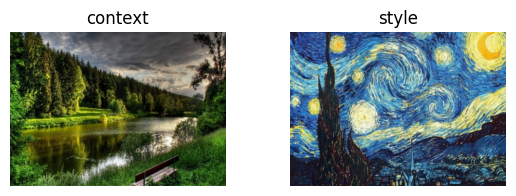

In [4]:
#展示原图和风格图
from PIL import Image
import matplotlib.pyplot as plt

# 读取三个图片
image1 = Image.open('context.jpg')
image2 = Image.open('style_fg.jpg')

# 创建一个带有三个子图的画布
fig, axes = plt.subplots(1, 2)

# 在每个子图上显示图片和标题
axes[0].imshow(image1)
axes[0].set_title('context')

axes[1].imshow(image2)
axes[1].set_title('style')

# 隐藏坐标轴
for ax in axes:
    ax.axis('off')

# 调整子图之间的间距
plt.subplots_adjust(wspace=0.3)

# 展示图片
plt.show()


因为设备算力限制，每次重新训练需要很久，这里把之前调试代码时候产生的的一些结果进行展示输出。

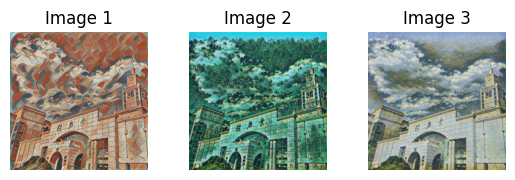

In [1]:
#读取图片并进行展示
from PIL import Image
import matplotlib.pyplot as plt

# 读取三个图片
image1 = Image.open('lzu+飞天.jpg')
image2 = Image.open('lzu+green.jpg')
image3 = Image.open('lzu+style2.jpg')

# 创建一个带有三个子图的画布
fig, axes = plt.subplots(1, 3)

# 在每个子图上显示图片和标题
axes[0].imshow(image1)
axes[0].set_title('Image 1')

axes[1].imshow(image2)
axes[1].set_title('Image 2')

axes[2].imshow(image3)
axes[2].set_title('Image 3')

# 隐藏坐标轴
for ax in axes:
    ax.axis('off')

# 调整子图之间的间距
plt.subplots_adjust(wspace=0.3)

# 展示图片
plt.show()


其中风格图片分别为

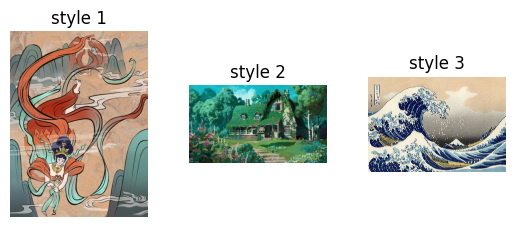

In [2]:
#读取图片并进行展示
from PIL import Image
import matplotlib.pyplot as plt

# 读取三个图片
image1 = Image.open('dhst.jpg')
image2 = Image.open('lv.jpg')
image3 = Image.open('style.jpg')

# 创建一个带有三个子图的画布
fig, axes = plt.subplots(1, 3)

# 在每个子图上显示图片和标题
axes[0].imshow(image1)
axes[0].set_title('style 1')

axes[1].imshow(image2)
axes[1].set_title('style 2')

axes[2].imshow(image3)
axes[2].set_title('style 3')

# 隐藏坐标轴
for ax in axes:
    ax.axis('off')

# 调整子图之间的间距
plt.subplots_adjust(wspace=0.3)

# 展示图片
plt.show()


### 实验总结
本次实验主要是实现风格迁移，自己尝试了很多代码，写过很多版本。有一些效果很好，或者自己希望的效果很好。但是因为设备问题，使用的模型需要一定的训练算力，往往太少轮的训练达不到很好的迁移效果。但是轮次太多设备计算困难，内核和显存经常报错。所以折中取了一些不太高的伦轮次进行训练展示。希望老师能够理解，后续若果有机会将重新训练进行输出展示效果好的迁移图片
同时jupyter因为内核的终端，程序的运行记录显得有些不太连贯，希望老师能够理解，每次都重头跑一边需要大量时间，所以记录中的时间没有连贯起来